In [58]:
import numpy as np
import scipy.io as sio
import scipy.signal as sig
import mne 
import matplotlib.pyplot as plt
from scipy.fftpack import fft, fftfreq
import pywt
import os

In [59]:
%matplotlib inline

In [60]:
def wavelet_decompose_plot(signal:np.ndarray,wavelet:str,lvl:int)->None:
    """
    Función para calcular la descomposición de una señal en wavelets y
    graficarla
    signal: señal a descomponer
    wavelet: wavelet a utilizar
    lvl: nivel de descomposición
"""
    colors = ['red', 'green', 'blue', 'orange', 'purple', 'brown',
    'pink', 'gray', 'olive', 'cyan']

    fig=plt.figure(figsize=(30, 10),dpi=600,tight_layout=True)
    coeffs = pywt.wavedec(signal, wavelet, level=lvl)
    for i in range(lvl):
        time=np.linspace(0,1,len(coeffs[i]))
        ax=fig.add_subplot(lvl, 1, i+1)
        ax.plot(time,coeffs[i], label=wavelet,color=colors[i])
        ax.set_title(i+1)
        ax.grid()
    fig.savefig(f"wavelet_{wavelet}_lvl_{lvl}.png",dpi=600)
    return None

In [61]:
def extract_signal(path:str)->np.ndarray or dict:
    """
    Función para extraer la señal de un archivo .txt,.EDF o .mat
    path: ruta del archivo
    return: Depende del tipo de archivo
    .txt -> Señal
    .edf -> Señal
    .mat -> Diccionario
    """
    # Leer la extension del archivo y cargar con la libreria correspondiente
    if os.path.splitext(path)[1] == '.txt':
        #Cargar el archivo de texto
        senial = np.loadtxt(path,skiprows=1)
        print("Señal extraida")
        return senial
    elif os.path.splitext(path)[1] == '.edf':
        #Cargar el archivo EDF
        data = mne.io.read_raw_edf(path, preload=True)
        # Extraer la señal del objeto ECG
        senial=data.get_data()
        print("Señal extraida")
        return senial
    elif os.path.splitext(path)[1] == '.mat':
        #Cargar el archivo mat
        data = sio.loadmat(path)
        print("Diccionario extraida")
        return data
    else:
        print("File extension not recognized")
    return None

# Procesamiento de señales reales

El procesamiento de señales reales es parte importante en la formación de un ingeniero biomédico. En este notebook se presentan algunos ejemplos de señales reales y se muestra como se puede procesar estas señales para obtener información útil de ellas.

## Bioseñales

Se conoce como bioseñales a las señales que se obtienen de fenómenos biológicos. Estas señales se pueden obtener de diferentes formas y se pueden utilizar para diferentes propósitos.

### ECG

La primera señal que se va a analizar es la señal de un electrocardiograma (ECG). El ECG es una señal que se obtiene de la actividad eléctrica del corazón. Esta señal se obtiene de la superficie del corazón y se puede obtener de diferentes formas. En este caso se va a utilizar un electrodo que se coloca en el pecho del paciente y que se conecta a un dispositivo que mide la señal. La señal se obtiene de la diferencia de potencial entre el electrodo y el corazón. La señal se muestra en la siguiente figura.

In [62]:
path=r"D:\Documentos\CUCEI\Clases\Procesamiento_de_Biosenales\Data\LJZ.edf"

In [63]:
path2=r"D:\Documentos\CUCEI\Clases\Seminario_De_Analisis_del_movimiento\data\Registros\fwdregistros18abril\ECG DATL.edf"

In [64]:
senial=extract_signal(path)

Extracting EDF parameters from D:\Documentos\CUCEI\Clases\Procesamiento_de_Biosenales\Data\LJZ.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 60999  =      0.000 ...    60.999 secs...
Señal extraida


In [65]:
senial=senial[0]

In [66]:
#Normalizar la señal
senial=senial/np.max(senial)

In [67]:
senial2=extract_signal(path2)[0,:]

Extracting EDF parameters from D:\Documentos\CUCEI\Clases\Seminario_De_Analisis_del_movimiento\data\Registros\fwdregistros18abril\ECG DATL.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 60999  =      0.000 ...    60.999 secs...
Señal extraida


In [68]:
senial2=senial2/np.max(senial2)

In [69]:
senial2*=-1

In [70]:
time=np.linspace(0, len(senial)/1000, len(senial))

In [71]:
senial*=-1

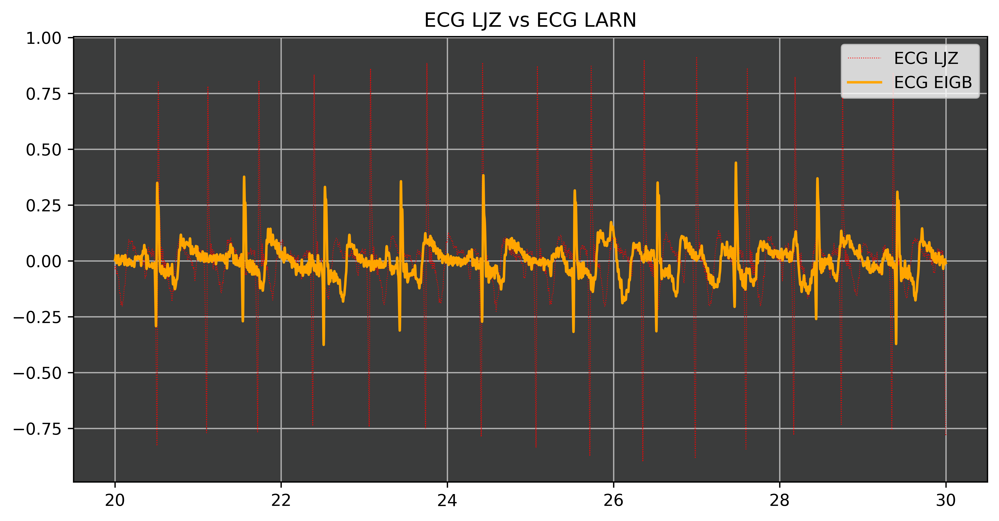

In [72]:
fig1=plt.figure(figsize=(10,5),dpi=600,edgecolor="black")
ax=fig1.add_subplot(111)
ax.plot(time[20000:30000],senial[20000:30000],color="red",label="ECG LJZ",linewidth=0.5,linestyle=":")
ax.plot(time[20000:30000],senial2[20000:30000],color="orange",label="ECG EIGB")
ax.set_facecolor((.233,.235,.237))
ax.legend(loc="upper right")
ax.set_title("ECG LJZ vs ECG LARN")
ax.grid()

Como pueden ver en esta figura, la señal es una __casi__ periodica esto quiere decir que la señal se repite cada cierto tiempo si bien no exactamente igual. En este caso la señal se repite cada 0.8 segundos. Esta señal se puede utilizar para determinar la frecuencia cardiaca del paciente. La frecuencia cardiaca es la cantidad de veces que el corazón se contrae por minuto. En este caso la frecuencia cardiaca es de 95 latidos por minuto.

Esta señal de ECG describe detalladamente el comportamiento cardiaco recordando que las diferentes ondas que se conocen en el ECG son:

* P: onda P representa la depolarización de las aurículas.
* QRS: onda QRS representa la depolarización de los ventrículos.
* T: onda T representa la repolarización de los ventrículos.
* U: onda U representa la repolarización de las aurículas(Esta onda no siempre se encuentra en el ECG).

In [106]:
wavelet_decompose_plot(senial[0:15000],wavelet='db1',lvl=3)

#### Comparacion de señales
Como saben la señal de ECG es una señal semi-estacionaria eso significa que si bien tiene un patrón repetitivo, este patrón no es exactamente igual. Esto se puede ver en la siguiente figura en la cual comparamos los primeros 5 segundos de la señal de ECG de todos ustedes.

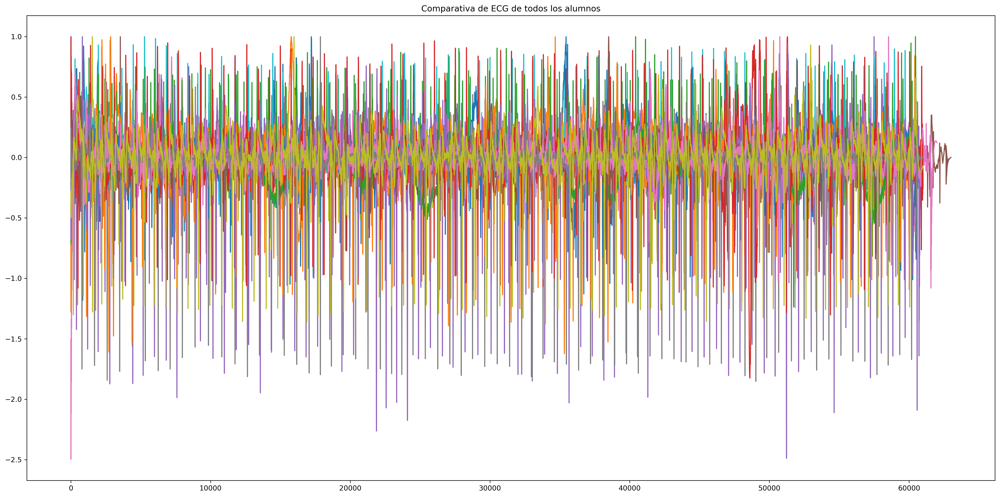

In [17]:
#Read all ECG txt files in the path folder
dir = r"D:\Documentos\CUCEI\Clases\Seminario_De_Analisis_del_movimiento\data\Registros\fwdregistros18abril/"
files = os.listdir(dir)
#Check files that start with "ECG" and end with ".txt"
files = [f for f in files if f.startswith("ECG") and f.endswith(".txt")]
#Read all files
signals = {}
for f in files:
    signals[f] = np.loadtxt(dir+f,skiprows=1)
#Normalize signals
for signal in signals:
    signals[signal] = signals[signal]/np.max(signals[signal])
# Plot all signals one above the other
plt.figure(figsize=(20, 10),dpi=300,tight_layout=True)
for signal in signals:
    plt.plot(signals[signal])
    plt.title("Comparativa de ECG de todos los alumnos")
del signal, signals, files, dir


#### Señales invertidas

Cuando realizamos registros de ECG algunas veces puede suceder que la señal se encuentre invertida. Esto quiere decir que la señal se encuentra en el rango de valores de -1 a 1 pero que los valores negativos se encuentran en el rango de valores de 1 a -1. Esto puede suceder por diferentes razones, por ejemplo, si la señal se encuentra en un archivo de texto y se carga con la función __np.loadtxt__ la señal se cargará con los valores negativos en el rango de valores de 1 a -1. Para solucionar esto podemos simplemente multiplicar la señal por -1.

#### Procesamiento de señales de ECG

Estas señales se pueden procesar para obtener información útil de ellas. En este caso se va a utilizar la señal de ECG primero para determinar la frecuencia cardiaca del paciente.

Para esto vamos a contar todos los picos asociados a la onda QRS. La onda QRS es la onda que se encuentra entre la onda P y la onda T.

Para contar los picos de la onda QRS vamos a utilizar la función __find_peaks__ de la librería __scipy.signal__.

In [108]:
# Buscamos los picos de la onda QRS
peaks, _ = sig.find_peaks(senial, height=0.3)
peaks2, _ = sig.find_peaks(senial2, height=0.3)

Con esta función se obtienen los índices de los picos de la señal que superen el valor de 2. Estos índices se guardan en la variable __peaks__.

Esta función también devuelve una variable __properties__ que contiene información adicional sobre los picos encontrados. En este caso no nos interesa esta información.

Ahora, como sabemos que esta señal fue tomada a una frecuencia de 1000 Hz quiere decir que cada índice representa 1 ms y entonces podemos calcular el tiempo que dura la señal dividiento la cantidad de índices por la frecuencia de muestreo.

In [109]:
#Calculo de la Duracion de la senial
duracion = len(senial)/1000
print("La duración de la señal es de {} segundos".format(duracion))

La duración de la señal es de 61.0 segundos


Entonces si la señal dura aproximadamente 1 minuto podemos calcular la frecuencia cardiaca como:
$$
    frecuencia = \frac{cantidad\ de\ picos}{tiempo\ de\ la\ señal} * 60
$$

In [110]:
#Contamos el número de picos
num_peaks = sig.find_peaks(senial,height=0.3)[0].size
#Calculamos la frecuencia
freq = (num_peaks*60)/duracion

print("La frecuencia cardíaca es de {} latidos por minuto".format(int(freq)))

La frecuencia cardíaca es de 93 latidos por minuto


Así de simple es calcular la frecuencia cardiaca de un paciente. En este caso la frecuencia cardiaca es de 95 latidos por minuto.

Ahora, esto es solo un ejemplo de como se puede procesar una señal de ECG para obtener información útil de ella. 

Utilizando la misma señal podemos utilizar la Transformada de Fourier para obtener información de la frecuencia de la señal. En este caso vamos a utilizar la función __fft__ de la librería __scipy.fft__.

In [55]:
# Computamos la transformada de Fourier
FFT = fft(senial2)
freqs = fftfreq(len(senial2), 1/1000)
mag=np.abs(FFT)
phase = np.angle(FFT)

En la primera línea de código se calcula la transformada de Fourier de la señal. En la segunda línea de código se calcula la frecuencia asociada a cada componente de la señal. En la tercera línea de código se calcula la magnitud de cada componente de la señal. En la cuarta línea de código se calcula la fase de cada componente de la señal.

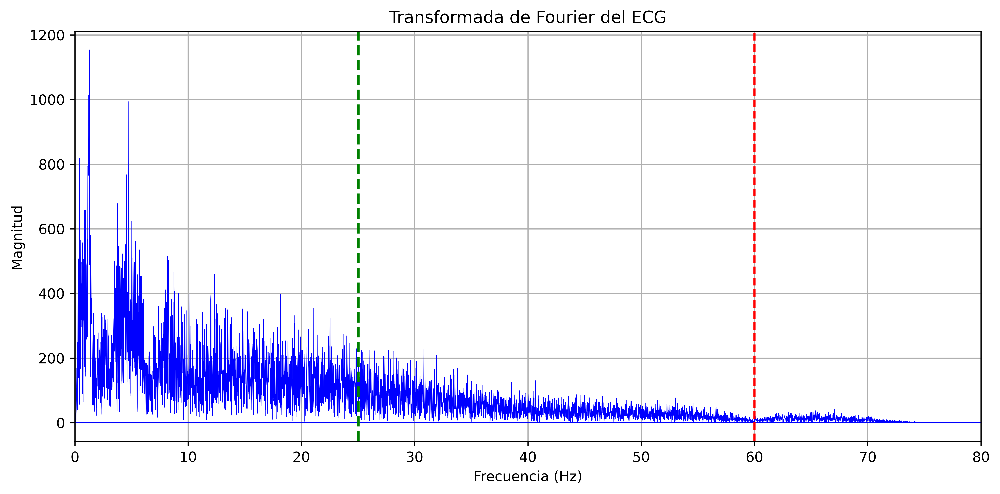

In [57]:
# Graficamos la transformada de Fourier
fig2=plt.figure(figsize=(10,5),dpi=600,tight_layout=True)
ax=fig2.add_subplot(111)
ax.plot(freqs, mag, color="b", linewidth=0.5)
ax.set_xlim(0,80)
ax.set_title("Transformada de Fourier del ECG")
#create a vertical line at 60 Hz
ax.axvline(x=60, color="r", linestyle="--")
ax.set_xlabel("Frecuencia (Hz)")
ax.set_ylabel("Magnitud")
ax.axvline(x=25,color="g", linestyle="--",linewidth=2)
ax.grid()

A simple vista puede que no les de nada de información esta señal, pero si la analizamos de forma detallada podemoa ver por ejemplo que no hay nada de señal en la frecuencia de 60 Hz, esto nos dice que al momento de capturar esta señal el equipo que estaban utilizando tenía un filtro analogico que eliminaba la señal de 60 Hz. Esto es importante porque la señal de 60 Hz puede interferir en el procesamiento de la señal y es una frecuencia que siempre está presente. __¿Por qué?__ porque la señal de 60 Hz es la frecuencia de la red eléctrica.

Qué otros usos le podemos dar a la transformada de Fourier? Podemos utilizarla para diseñar filtros para eliminar ruido de la señal. En este caso vamos a utilizar la función __f__ de la librería __scipy.signal__ para diseñar un filtro pasabajos. Este será un filtro que va a eliminar las frecuencias que estén por encima de 50 Hz. Porque 50 Hz? Porque la frecuencia de la red eléctrica es de 60 Hz y queremos eliminar la señal que ya no posee información útil y como pueden ver en la figura anterior el porcentaje de la señal que se encuentra por encima de 50 Hz es muy pequeño.

In [113]:
# Diseñar un filtro pasabajas 50 Hz
b, a = sig.butter(4, 25, 'low', fs=1000)
# Aplicar el filtro a la señal original
senial_filtrada=sig.filtfilt(b, a, senial)

De qué nos sirve esto? Nos sirve para eliminar el ruido de la señal y poder analizarla de forma más sencilla. ¿Cómo sabremos si el filtro funciona? Vamos a graficar la señal filtrada y la señal original para ver si se eliminó el ruido.

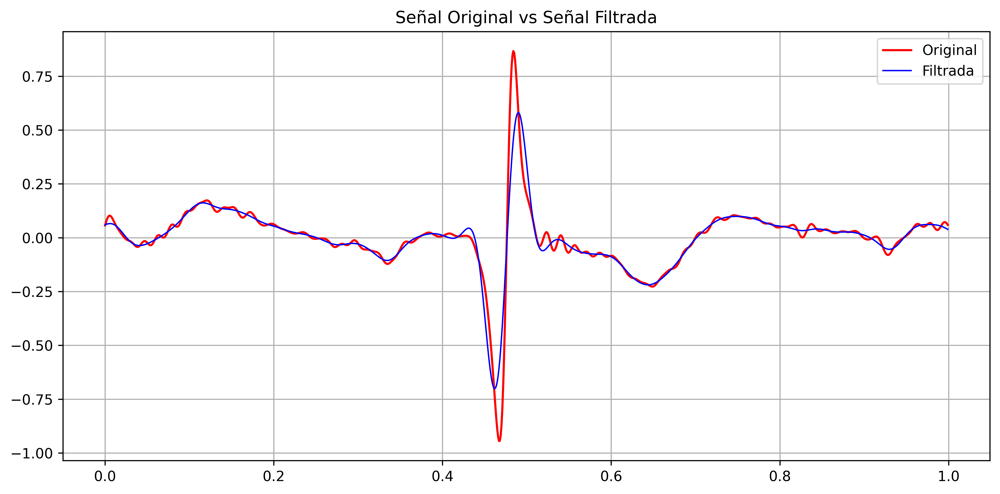

In [114]:
# Graficar la señal original y la señal filtrada
fig3=plt.figure(figsize=(10,5),dpi=600,tight_layout=True)
ax=fig3.add_subplot(111)
ax.plot(time[0:1000],senial[0:1000],color="r",linewidth=1.5,label="Original")
ax.plot(time[0:1000],senial_filtrada[0:1000],color="b",linewidth=1,label="Filtrada")
ax.set_title("Señal Original vs Señal Filtrada")
ax.legend(loc="upper right")
ax.grid()

Para que el efecto del filtro sea más evidente se graficó solo un segmento de la señal. Cómo pueden ver la señal original tenía algunas perturbaciones despues de los picos de la onda QRS y estas perturbaciones desaparecieron luego de aplicar el filtro.

Esto es increiblemente util para el suavizado de señales. Por ejemplo, si queremos obtener la frecuencia cardiaca de un paciente pero la señal tiene ruido, podemos utilizar un filtro para eliminar el ruido y luego aplicar la función __find_peaks__ para contar los picos de la onda QRS.

Para el diseño de algoritmos de inteligencia artificial es muy importante el procesamiento de señales. En este documento se presentaron algunos ejemplos de señales reales y se mostró como se puede procesar estas señales para obtener información útil de ellas.

### EMG

Ahora vamos a analizar una señal de electromiografía (EMG). La EMG es una señal que se obtiene de la actividad eléctrica de los músculos. Esta señal se obtiene de la superficie del músculo y se puede obtener de diferentes formas. Para este trabajo ustedes deben haber obtenido las señales en el laboratio de Bioseñales utilizando 2 electrodos de captura de señal y 1 electrodo de referencia. En este caso utilizaremos señales obtenidas previamente de la misma forma.

#### Carga de datos

En este caso las señales fueron entregadas en un archivo de formato __.edf__ Para cargar este archivo usaremos las mismas herramientas que ya hemos visto con el ECG

In [47]:
path=r"D:\Documentos\CUCEI\Clases\Seminario_De_Analisis_del_movimiento\data\Registros\fwdregistros18abril\EMG MLLC.edf"

#### Preprocesamiento

In [48]:
EMG=extract_signal(path)

Extracting EDF parameters from D:\Documentos\CUCEI\Clases\Seminario_De_Analisis_del_movimiento\data\Registros\fwdregistros18abril\EMG MLLC.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 37999  =      0.000 ...    37.999 secs...
Señal extraida


In [49]:
EMG=EMG[0]

In [50]:
# Vector de tiempo
time=np.linspace(0, len(EMG)/1000, len(EMG))

In [51]:
# Normalizamos la señal
EMG = (EMG - np.mean(EMG)) / np.std(EMG)

Una vez que tenemos las señales vamos a graficarlas para ver como se ven.

In [53]:
fig4=plt.figure(figsize=(30,5),dpi=600,tight_layout=True)
ax=fig4.add_subplot(111)
ax.plot(time,EMG,color="r",linewidth=1.5,label="EMG")
ax.set_title("EMG")
ax.legend()
ax.grid()

#### Transformada de Fourier

La señal de EMG es una señal que se encuentra en el rango de frecuencias de 20 Hz a 500 Hz. Esta a diferencia de la señal de ECG que posee un comportamiento más ruidoso. En este caso vamos a utilizar la transformada de Fourier para ver que frecuencias se encuentran en la señal.

In [121]:
# Computamos la transformada de Fourier
FFT = fft(EMG)
freqs = fftfreq(len(EMG), 1/1000)
mags=np.abs(FFT)
phases = np.angle(FFT)

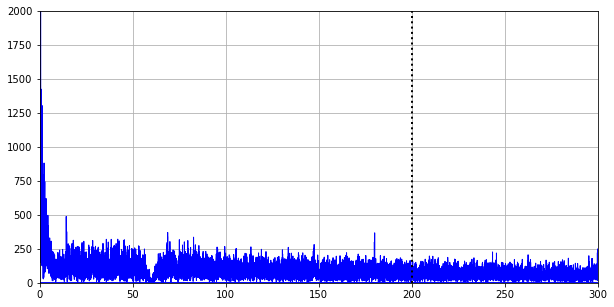

In [122]:
# Graficar la Transformada de Fourier
fig5=plt.figure(figsize=(10,5))
ax=fig5.add_subplot(111)
ax.plot(freqs, mags, color="b", linewidth=1)
ax.set_xlim(0,300)
ax.set_ylim(0,2000)
ax.axvline(x=200, color='k', linewidth=2,linestyle=":")
ax.grid()

#### Filtrado de señales

Cómo pueden ver en esta figura el el rango de frecuencias y la distribución de la energía de la señal es muy diferente a la señal de ECG. Para empezar el rango de frecuencias es mucho más amplio y la energía se encuentra concentrada en el rango de frecuencias de 20 Hz a 500 Hz. Además, la señal de EMG tiene una forma de onda más compleja que la señal de ECG. por lo que es más difícil de analizar. Pero no por eso es imposible. En este caso vamos a diseñar un filtro pasabajos para eliminar las frecuencias que estén por debajo de 50 Hz y por encima de 500 Hz. Esto es porque la señal de EMG se encuentra en el rango de frecuencias de 20 Hz a 500 Hz y queremos eliminar las frecuencias que no nos interesan.

In [123]:
# Diseñar un filtro pasabanda 20-450 Hz
b, a = sig.butter(4, 200, 'lowpass', fs=1000)
# Aplicar el filtro a la señal original
filtered_signal=sig.filtfilt(b, a, EMG)

In [124]:
# Graficar la señal original y la señal filtrada
fig6=plt.figure(figsize=(30,5),dpi=600,tight_layout=True)
ax=fig6.add_subplot(111)
ax.plot(time[7000:8000],EMG[7000:8000],color="r",linewidth=1.5,label="Original")
ax.plot(time[7000:8000],filtered_signal[7000:8000],color="b",linewidth=1,label="Filtrada")
ax.legend()
ax.set_title("EMG original vs Filtro manual")
ax.grid()
fig6.savefig("EMG1.png")

Como pueden ver en la figura anterior el filtro funciona muy bien. Su efecto no es tan evidente como en el caso de la señal de ECG, pero si se puede ver que se eliminó el ruido de la señal.

Ahora, este filtro fue muy exagerado precisamente para que los efectos se noten más, al diseñar filtros para eliminar ruido de la señal es importante que el filtro sea lo menos agresivo posible para que no se pierda información de la señal. Esto significa que mientras más parecidas sean las señales al ruido más complicado es diseñar un filtro que elimine el ruido sin eliminar información de la señal. Entonces ¿Qué podemos hacer para eliminar el ruido de la señal sin eliminar información de la señal? Una opción es utilizar un filtro adaptativo. En este caso vamos a utilizar un filtro adaptativo de mínimos cuadrados. Para esto vamos a utilizar la función __lms__ de la librería __scipy.signal__.

In [125]:
# Filtro adaptativo de minimos cuadrados

from scipy.signal import lfilter

filtered_signal = lfilter([1, -0.9], 1, EMG)

In [126]:
# Graficar la señal original y la señal filtrada
fig7=plt.figure(figsize=(30,5),dpi=600,tight_layout=True)
ax=fig7.add_subplot(111)
ax.plot(time[7000:8000],EMG[7000:8000],color="r",linewidth=1.5,label="Original")
ax.plot(time[7000:8000],filtered_signal[7000:8000],color="b",linewidth=1,label="Filtrada")
ax.legend()
ax.grid()
ax.set_title("EMG original vs Filtro adaptativo")
fig7.savefig("EMG.png")

Este filtro es autoajustable, es decir, que se ajusta a la señal que se le entrega y elimina el ruido con métodos estadísticos. Estos filtros no son perfectos, pero son muy útiles para eliminar el ruido de la señal.

Como pueden ver en la figura anterior el filtro funciona muy bien. Su efecto es más evidente que en el caso del filtro pasabajos. Además, el filtro adaptativo no elimina toda la señal de ruido, sino que la reduce. Esto es importante porque si eliminamos toda la señal de ruido estamos eliminando información de la señal.

### EEG

#### Cargado de señales

Culminando con este tema vamos a analizar una señal de electroencefalografía (EEG). La EEG es una señal que se obtiene de la actividad eléctrica del cerebro. Esta señal se obtiene de la superficie del cerebro y se puede obtener de diferentes formas. Para este trabajo utilizaremos señales obtenidas del laboratorio de Bioseñales utilizando 21 electrodos de captura de señal y 1 electrodo de referencia.

In [127]:
path=r"D:\Documentos\CUCEI\Clases\Seminario_De_Analisis_del_movimiento\data\Registros\EEG_crudo.mat"
EEG = extract_signal(path)

Diccionario extraida


Así como con la señal anterior, en este caso las señales fueron entregadas en un archivo de formato __.mat__ que es un formato de archivo que se utiliza para guardar variables de Matlab. Para poder leer este archivo vamos a utilizar la función __loadmat__ de la librería __scipy.io__. y luego vamos a obtener las keys del diccionario que nos entrega la función __loadmat__.

In [128]:
# Imprimir las llaves del diccionario
EEG.keys()

dict_keys(['__header__', '__version__', '__globals__', 'EEG'])

En este caso las señales se encuentran en la key del diccionario que se llama __EEG__. Ahora vamos a obtener las señales y obtenerla en una variable llamada __signals__. 

In [129]:
# Extraemos la señal del diccionario
signals=EEG["EEG"]
# Normalizamos la señal
signals = (signals - np.mean(signals)) / np.std(signals)

#### Forma de las señales

Si nos fijamos en la manera en que estas señales se encuentran almacenadas podemos ver que son varios arreglos de 1 dimension agrupados en un arreglo de 2 dimensiones. Esto significa que tenemos 21 señales de 1 dimensión. Por convencion en el mundo de la ingeniería de señales se utiliza la notación __NxM__ para indicar que tenemos __N__ señales de __M__ muestras. En este caso tenemos 21 señales de 1000 muestras. Por lo tanto, vamos a verlas señales y la forma en que se encuentran almacenadas.

In [130]:
# Obtener la forma de la señal
signals.shape

(21, 16001)

El comando __shape__ nos entrega la forma en que se encuentra almacenada la variable. En este caso tenemos 21 señales. Ahora vamos a graficarlas para ver como se ven.

In [131]:
# Debido a la naturaleza de la siguiente grafica es necesario hacer un vector de tiempo
time = np.linspace(0,signals.shape[1]/1000,signals.shape[1])

#### Graficar las señales

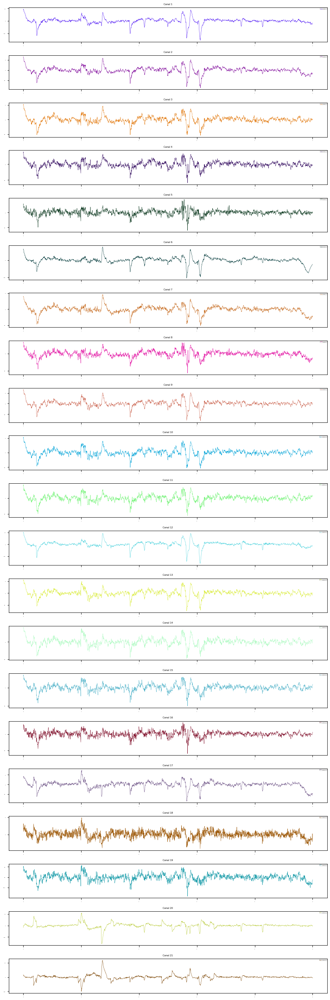

In [138]:
# Graficar las 21 señales
fig8=plt.figure(figsize=(10,30),tight_layout=True)
for i in range(21):
    ax=fig8.add_subplot(21,1,i+1)
    #Create a random color for each line
    color=np.random.rand(3,)
    ax.plot(time[0:5000],signals[i,0:5000],color=color,linewidth=0.5,label="Canal {}".format(i+1))
    ax.legend(loc="upper right",fontsize=2)
    plt.yticks(fontsize=2)
    plt.xticks(fontsize=2)
    ax.set_title("Canal {}".format(i+1),fontsize=5)

#### Transformada de Fourier

La señal de EEG es una señal que se encuentra en el rango de frecuencias de 0.1 Hz a 30 Hz. Esta a diferencia de la señal de ECG que posee un comportamiento más ruidoso que el ECG pero menos que el EMG. En este caso vamos a utilizar la transformada de Fourier para ver que frecuencias se encuentran en la señales de cada canal.

In [133]:
FFTs=[]
Freqss=[]
Mags=[]
Phases=[]
for i in range(21):
    FFT = fft(signals[i,:])
    freqs = fftfreq(len(signals[i,:]), 1/1000)
    mags=np.abs(FFT)
    phases = np.angle(FFT)
    FFTs.append(FFT)
    Freqss.append(freqs)
    Mags.append(mags)
    Phases.append(phases)


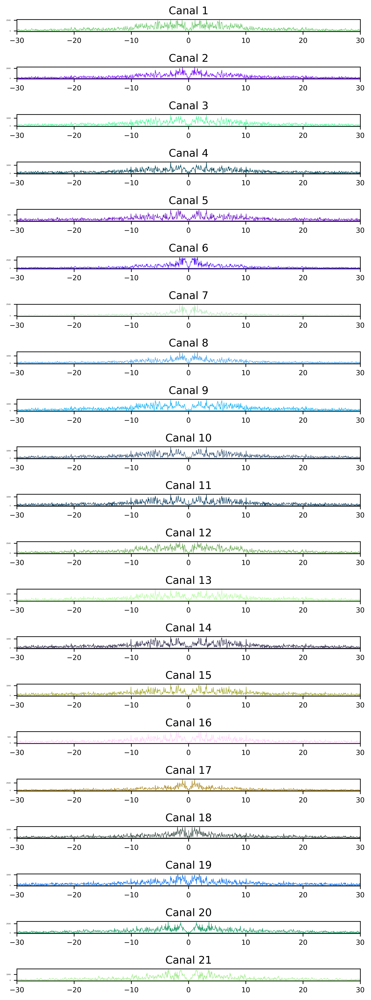

In [134]:
fig9=plt.figure(figsize=(6,16),dpi=600,tight_layout=True)
for i in range(21):
    ax=fig9.add_subplot(21,1,i+1)
    color=np.random.rand(3,)
    ax.plot(Freqss[i], Mags[i], color=color, linewidth=0.5,label="Canal {}".format(i+1))
    ax.title.set_text("Canal {}".format(i+1))
    ax.set_xlim(-30,30)
    plt.yticks(fontsize=2)
    plt.xticks(fontsize=8)

En Las transformadas de Fourier de las señales de EEG podemos ver que la energía se encuentra concentrada en el rango de frecuencias de 0.1 Hz a 10 Hz esto debido a que el sujeto se encontraba en reposo. Además, podemos ver que el espectro de frecuencias es muy diferente para cada canal. Esto es debido a que cada canal se encuentra en una parte diferente del cerebro y por lo tanto la actividad eléctrica que se encuentra en cada canal es diferente. Por lo tanto, es importante que se analicen las señales de cada canal por separado.

#### Wavelets

Para esta señal vamos a trabajar con una herramienta diferente a las utilizadas en las señales anteriores, vamos a utilizar **__Wavelets__**. Las wavelets son una herramienta que nos permite analizar la señal en diferentes escalas de tiempo. Esto es muy útil para analizar señales que tienen comportamientos no lineales.

Las wavelets son funciones matemáticas que se utilizan en el procesamiento de señales para analizar y representar señales en el dominio del tiempo y la frecuencia de manera simultánea. A diferencia de otras técnicas de procesamiento de señales, como la transformada de Fourier, que solo proporciona información sobre la frecuencia de una señal, las wavelets ofrecen información tanto en el dominio del tiempo como en el de la frecuencia.

Las wavelets se utilizan para analizar y procesar señales en una amplia gama de aplicaciones, como procesamiento de imágenes, compresión de datos, reconocimiento de patrones, procesamiento de señales biomédicas, procesamiento de audio, entre otros. Se pueden utilizar tanto en señales continuas como discretas.

El procesamiento de señales con wavelets generalmente implica los siguientes pasos:

1. Selección de una wavelet: Existen diferentes tipos de wavelets con características específicas, como la wavelet de Haar, la wavelet de Daubechies, la wavelet de Morlet, entre otras. La selección de una wavelet adecuada depende del tipo de señal que se está procesando y del objetivo del análisis.

2. Descomposición: La señal original se descompone en diferentes escalas y posiciones utilizando la convolución de la señal con la wavelet seleccionada. Esto permite obtener información detallada de la señal en diferentes niveles de resolución.

3. Análisis en el dominio de la frecuencia y tiempo: La descomposición con wavelets permite analizar la señal tanto en el dominio de la frecuencia como en el dominio del tiempo de manera simultánea. Esto es útil para identificar cambios en la señal en diferentes escalas de tiempo y frecuencia.

4. Procesamiento de la señal: Una vez que la señal se ha descompuesto y se ha obtenido información en el dominio del tiempo y la frecuencia, se pueden aplicar diferentes técnicas de procesamiento de señales, como filtrado, detección de eventos, extracción de características, etc.

5. Reconstrucción: Después de realizar el procesamiento deseado en la señal, se puede reconstruir la señal original a partir de la combinación de las aproximaciones y detalles obtenidos en la descomposición wavelet.

En resumen, las wavelets son una herramienta poderosa en el procesamiento de señales que permiten analizar y representar señales en el dominio del tiempo y la frecuencia de manera simultánea, lo que las hace adecuadas para una amplia gama de aplicaciones en el procesamiento de señales.


#### Wavelet Packet Decomposition

Esto es una __Descomposicion Wavelet__ de la señal de EEG. Esto significa que utilizamos una "onda" o una funcion matematica para descomponer la señal en diferentes escalas de tiempo. En este caso utilizamos la wavelet DB esta es una funcion matematica que se utiliza para descomponer la señal en diferentes escalas de tiempo.

Esto puede parecer muy complejo Pero pueden entenderlo como una forma de comparacion de la señal con una onda en particular y entonces señal se descompone en diferentes niveles pertenecientes a ciertas "ventanas" de frecuencias y podemos ver que componentes de la señal se encuentran en cada nivel. Estas ventanas de frecuencias se llaman __escalas__ y las diferentes ventanas de frecuencias se llaman __familias__.

Esta es una herramienta que verán mas a detalle más adelante en la carrera pero es muy util en el procesamiento de señales.
